# N-Queens

## Solving N-Queens problem using the following algorithms:
#### 1. Genetic algorithm
#### 2. Simulated Annealing


## Genetic Algorithm (Classic)

### Implementing Chromosome structure

In [36]:
import numpy as np
import random
import matplotlib.pyplot as plt

In [37]:
import time

In [38]:
class Chromosome:
    
    def __init__(self, N: int, is_child: bool):
        
        # N = Dimention of the chess board
        if N == 2 or N == 3:
            raise ValueError("Invalid input")
        
        self.N = N
        
        # Fitness metric 
        self.cost = 0
        
        
        
        if not is_child:
            # Initiate chess board randomly
            self.board = np.random.choice(range(0, self.N), size=self.N, replace=False)
            # Compute cost
            self.compute_cost()
            
        else:
            # Initiate board
            self.board = np.zeros(shape=self.N, dtype=int)
        
        
    def compute_cost(self) -> None:
        
        self.cost = 0
        
        for i in range(self.N):
            for j in range(i+1, self.N):
                if abs(j - i) == abs(self.board[j] - self.board[i]):
                    self.cost += 1
                    
    
        

### Main Genetic Algorithm

In [39]:
class Genetic:
    
    def __init__(self, population: int, generations: int, N: int):
        self.pop_num = population
        self.generations = generations
        self.N = N
     
    # Create random population   
    def create_population(self) -> None:
        
        population = [Chromosome(self.N, False) for _ in range(self.pop_num)]
        self.population_np = np.array(population, dtype=Chromosome)
        
        
        
        # Sort the population based on their costs
        costs = np.array([chromosome.cost for chromosome in self.population_np])
        sorted_costs = np.argsort(costs)
        self.sorted_population = self.population_np[sorted_costs]
        
        
       
        
    # Select top (K*self.pop) of the population as parents
    def select_parents(self, K: float) -> None:
        
        self.parents = self.sorted_population[:int(K*self.pop_num)]
        
       
            
    
    # Select (k*self.N) genes from one and the rest from the other    
    def crossover(self, k: float, alpha: float) -> None:
        
        children = []
        for i in range(len(self.parents) - 1):
            
            cut = int(k*self.N)
            r = np.random.randint(0, self.N-cut)    # Cut a random slice from the first parent
            
            
            
            children.append(self.create_child(p1=self.parents[i], p2=self.parents[i+1], r=r, cut=cut, alpha=alpha))
            
       
        
        self.sorted_population = self.sorted_population[:-len(children)]     # Remove the weakest ones from population and add new children
        new_population = np.append(self.sorted_population, children)         # Add children to the population
        
        # Sort the population again
        costs = np.array([chromosome.cost for chromosome in new_population])
        sorted_costs = np.argsort(costs)
        self.sorted_population = new_population[sorted_costs]
            
            
    def create_child(self, p1: Chromosome,
                     p2: Chromosome, r: int,
                     cut: int, alpha: float) -> np.ndarray:
        
        
        child = Chromosome(self.N, True)                # Initiate new child
        child.board[r:r+cut] = p1.board[r:r+cut]        # Copy from the first parent (p1)
        
        # Add from p2 in a way that doesn't violate the permutation condition
        i = 0
        j = 0
        while (i < self.N):
            
            if r <= i < r+cut:
                i += 1
                continue
            
            if p2.board[j] in p1.board[r:r+cut]:
                j += 1
                continue
                
            child.board[i] = p2.board[j]
            i += 1
            j += 1
        
        # Mutation  
        if random.random() < alpha:
            
            # print("Mutation")
            
            e1 = np.random.randint(0, self.N - 1)
            e2 = np.random.randint(0, self.N - 1)
            if e1 == e2:
                e2 = int((e2 + 1) / self.N)
                
            tmp = child.board[e1]
            child.board[e1] = child.board[e2]
            child.board[e2] = tmp
                
            
        child.compute_cost()
            
        return child
        
        
    def run(self, K: float, k: float, alpha: float) -> tuple[Chromosome, dict[str, list[float]]]:
        
        self.create_population()        # Initialize a random population
        
        counter = 0
        
        history = {"best": []}

        # initial stats
        costs = np.array([c.cost for c in self.sorted_population])
        history["best"].append(int(costs.min()))
        
        while (counter < self.generations):
            
            if (self.sorted_population[0].cost == 0):
                return self.sorted_population[0], history
            
            print(f"Generation {counter}. Current best solution is {self.sorted_population[0].cost}.")
            
            self.select_parents(K=K)
            self.crossover(k=k, alpha=alpha)
            
            costs = np.array([c.cost for c in self.sorted_population])
            history["best"].append(int(costs.min()))
           

            
            counter += 1
            
        return self.sorted_population[0], history
            
        

In [40]:
# Visualization helper
def plot_history(history: dict[str, list[float]], save_path: str = None, show: bool = True) -> None:
    """
    history: dict with keys 'best','avg','median','max' -> lists of same length
    save_path: optional path to save the figure (e.g., "history.png")
    """
    gens = list(range(len(history["best"])))
    plt.figure(figsize=(10, 5))
    plt.plot(gens, history["best"], label="best")
    plt.xlabel("Generation")
    plt.ylabel("Cost (number of attacking pairs)")
    plt.title("Genetic Algorithm: cost vs generation")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=200)
    if show:
        plt.show()
    plt.close()


Generation 0. Current best solution is 10.
Generation 1. Current best solution is 8.
Generation 2. Current best solution is 8.
Generation 3. Current best solution is 8.
Generation 4. Current best solution is 8.
Generation 5. Current best solution is 8.
Generation 6. Current best solution is 7.
Generation 7. Current best solution is 7.
Generation 8. Current best solution is 7.
Generation 9. Current best solution is 7.
Generation 10. Current best solution is 7.
Generation 11. Current best solution is 7.
Generation 12. Current best solution is 7.
Generation 13. Current best solution is 7.
Generation 14. Current best solution is 7.
Generation 15. Current best solution is 7.
Generation 16. Current best solution is 7.
Generation 17. Current best solution is 7.
Generation 18. Current best solution is 7.
Generation 19. Current best solution is 7.
Generation 20. Current best solution is 7.
Generation 21. Current best solution is 7.
Generation 22. Current best solution is 7.
Generation 23. Curre

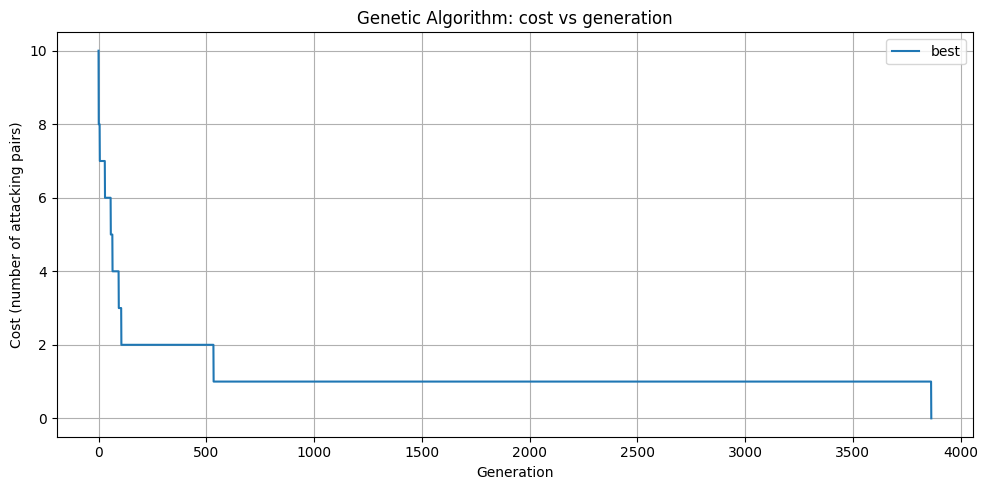

In [41]:
random.seed(1)
np.random.seed(1)
start = time.time()
g = Genetic(population=200, generations=5000, N=30)
best, history = g.run(K=0.4, k=0.4, alpha=0.15)

end = time.time()

print(f"The best solution found is {best.board} with cost {int(best.cost)}")
plot_history(history, save_path="history.png")

In [42]:
print(f"Computation time: {end - start}")

Computation time: 47.870182037353516


In [43]:
from matplotlib.colors import ListedColormap
from typing import Union, Tuple

def plot_board(board_or_chrom: Union[np.ndarray, list, object],
               figsize: Tuple[int,int]=(8,8),
               save_path: str = None,
               show: bool = True,
               queen_glyph: str = "♛",
               use_fallback_marker: bool = False) -> None:
    
    # Extract board array & N
    if hasattr(board_or_chrom, "board"):
        board = np.array(board_or_chrom.board, dtype=int)
        N = board_or_chrom.N
        cost = getattr(board_or_chrom, "cost", None)
    else:
        board = np.array(board_or_chrom, dtype=int)
        N = board.shape[0]
        cost = None

    
    pattern = np.add.outer(range(N), range(N)) % 2
    cmap = ListedColormap(["#f0d9b5ff", "#b58863"]) 

    fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(pattern, cmap=cmap, interpolation='nearest', origin='upper', aspect='equal')

    
    base_fontsize = max(10, int(min(80, 600 / N)))  
    fontdict = {"fontname": "DejaVu Sans", "fontweight": "bold"}

    if use_fallback_marker:
        # fallback scatter marker (very robust)
        xs = board
        ys = np.arange(N)
        ax.scatter(xs, ys, marker='X', s=(base_fontsize*10), linewidths=1.0, zorder=3)
    else:
        for row in range(N):
            col = int(board[row])
            # put the glyph centered in the square; use zorder > image
            ax.text(col, row, queen_glyph,
                    fontsize=base_fontsize,
                    ha='center', va='center',
                    zorder=3,
                    **fontdict)

    
    ax.set_xticks(np.arange(N))
    ax.set_yticks(np.arange(N))
    ax.set_xticklabels(np.arange(N))
    ax.set_yticklabels(np.arange(N))
    ax.set_xlim(-0.5, N - 0.5)
    ax.set_ylim(N - 0.5, -0.5)
    ax.set_aspect('equal')
    title_cost = f"  —  cost={cost}" if cost is not None else ""
    ax.set_title(f"N-Queens solution (N={N}){title_cost}")
    ax.set_xlabel("Column")
    ax.set_ylabel("Row")
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=200, bbox_inches='tight')
    if show:
        plt.show()
    plt.close()

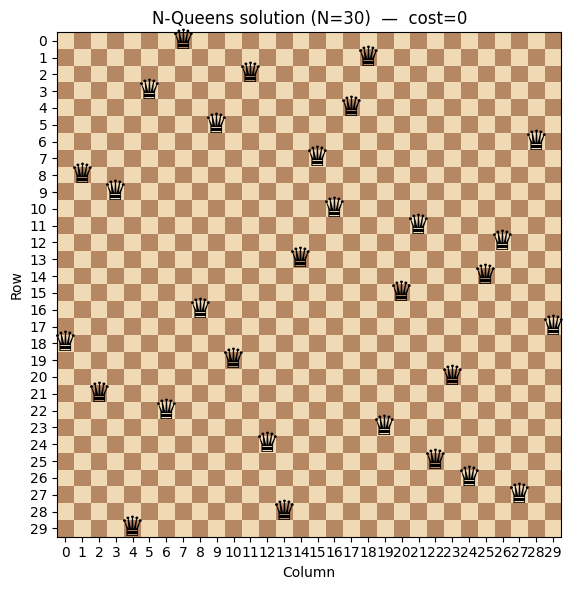

In [44]:
plot_board(best, figsize=(6,6), save_path="best_board.png", show=True)

## Genetic Algorithm (Generalized)

### Chromosome

In [45]:
from typing import List, Tuple, Union
from matplotlib.colors import ListedColormap

class Chromosome_General:
    
    # Positions of queens are stored in list as tuples of their coordinations
    def __init__(self, N: int, M: int, positions: List[Tuple[int,int]] = None):
        
        self.N = N
        self.M = M
        if positions is None:
            self.positions = self.random_positions()
        else:
            if len(positions) != M:
                raise ValueError("positions must have length M")
            # ensure positions are unique and valid
            pos_set = set(positions)
            if len(pos_set) != M:
                raise ValueError("positions must contain M unique coordinate pairs")
            self.positions = list(positions)
        self.cost = self.compute_cost()

    def random_positions(self) -> List[Tuple[int,int]]:
        total = self.N * self.N
        flat = np.random.choice(total, self.M, replace=False)
        rows, cols = np.unravel_index(flat, (self.N, self.N))
        return list(zip(rows.tolist(), cols.tolist()))

    def compute_cost(self) -> int:
        
        cost = 0
        coords = self.positions
        L = len(coords)
        for i in range(L):
            r1, c1 = coords[i]
            for j in range(i+1, L):
                r2, c2 = coords[j]
                if r1 == r2 or c1 == c2 or abs(r1 - r2) == abs(c1 - c2):
                    cost += 1
        self.cost = cost
        return cost

    def to_board(self) -> np.ndarray:
        board = np.zeros((self.N, self.N), dtype=int)
        for (r, c) in self.positions:
            board[r, c] = 1
        return board

    def copy(self) -> "Chromosome_General":
        return Chromosome_General(self.N, self.M, positions=list(self.positions))



In [46]:

class Genetic_General:
    
    def __init__(self, population: int, generations: int, N: int, M: int):
        
        self.pop_num = population
        self.generations = generations
        self.N = N
        self.M = M
        
        

    def create_population(self) -> None:
       
        pop = [Chromosome_General(self.N, self.M) for _ in range(self.pop_num)]
        # sort by cost ascending
        pop.sort(key=lambda c: c.cost)
        self.population = pop

    def select_parents(self, K: float) -> List[Chromosome_General]:
       
        k_count = max(2, int(K * self.pop_num))  # at least 2 parents
        parents = self.population[:k_count]
        return parents

        # One-point crossover on the positions list. Then deduplicate and fill to M.
    def crossover_pair(self, p1: Chromosome_General, p2: Chromosome_General) -> Chromosome_General:
    
        # Randomize order of positions inside parents to avoid positional bias
        p1_list = list(p1.positions)
        p2_list = list(p2.positions)
        random.shuffle(p1_list)
        random.shuffle(p2_list)

        # split point
        if self.M > 1:
            split = random.randint(1, self.M - 1)
        else:
            split = 1

        child_positions = []
        taken = set()

        # take first chunk from p1
        for pos in p1_list[:split]:
            if pos not in taken:
                child_positions.append(pos)
                taken.add(pos)

        # then take from p2 preserving order, skipping duplicates
        for pos in p2_list:
            if len(child_positions) >= self.M:
                break
            if pos not in taken:
                child_positions.append(pos)
                taken.add(pos)

        # if not enough positions, fill randomly from remaining empty cells
        if len(child_positions) < self.M:
            all_cells = [(r, c) for r in range(self.N) for c in range(self.N)]
            remaining = [cell for cell in all_cells if cell not in taken]
            needed = self.M - len(child_positions)
            chosen = random.sample(remaining, needed)
            child_positions.extend(chosen)

        child = Chromosome_General(self.N, self.M, positions=child_positions)
        return child

        # With probability alpha, move one random queen to a random empty cell.
    def mutation(self, chrom: Chromosome_General, alpha: float) -> None:
    
        if random.random() >= alpha:
            return

        taken = set(chrom.positions)
        # pick a queen to move
        idx = random.randrange(len(chrom.positions))
        # available empty cells
        all_cells = [(r, c) for r in range(self.N) for c in range(self.N)]
        empty_cells = [cell for cell in all_cells if cell not in taken]

        if not empty_cells:
            return  # no place to move (unlikely unless M == N*N)
        new_pos = random.choice(empty_cells)

        # perform move
        chrom.positions[idx] = new_pos
        chrom.compute_cost()


    
        # Create children by pairing consecutive parents (1-2, 3-4, ...).
        # Number of children will be equal to number of parents - 1 (similar to your prior logic),
        # but we'll produce enough children to replace the worst half of the population.
    def create_children(self, parents: List[Chromosome_General], alpha: float) -> List[Chromosome_General]:
        
        children = []
        pcount = len(parents)
        if pcount < 2:
            return children

        # we will generate children until we have enough to replace the worst half (or at least 1)
        target_children = max(1, int(self.pop_num / 2))

        i = 0
        while len(children) < target_children:
            p1 = parents[i % pcount]
            p2 = parents[(i + 1) % pcount]
            child = self.crossover_pair(p1, p2)
            self.mutation(child, alpha)
            child.compute_cost()
            children.append(child)
            i += 1

        return children

    def run(self, K: float, alpha: float) -> Tuple[Chromosome_General, dict]:
        
        self.create_population()

        history = {"best": []}
        history["best"].append(self.population[0].cost)

        for gen in range(self.generations):
            best = self.population[0]
            if best.cost == 0:
                print(f"Found solution at generation {gen} with cost 0.")
                return best, history

            print(f"Generation {gen}: best cost = {best.cost}")

            parents = self.select_parents(K=K)
            children = self.create_children(parents, alpha=alpha)

            # Replace worst individuals with children
            new_pop = self.population[:self.pop_num - len(children)] + children
            new_pop.sort(key=lambda c: c.cost)
            self.population = new_pop

            history["best"].append(self.population[0].cost)

        return self.population[0], history



In [47]:
# Function fo plotting the result
def plot_board_generalized(board_or_chrom: Union[np.ndarray, list, object],
               figsize: Tuple[int,int]=(8,8),
               save_path: str = None,
               show: bool = True,
               queen_glyph: str = "♛",
               use_fallback_marker: bool = False) -> None:
   
    # Resolve board and cost, N
    if hasattr(board_or_chrom, "positions"):
        # positions representation
        positions = board_or_chrom.positions
        N = board_or_chrom.N
        cost = getattr(board_or_chrom, "cost", None)
        board = np.zeros((N, N), dtype=int)
        for r, c in positions:
            board[r, c] = 1
    elif hasattr(board_or_chrom, "board"):
        board = np.array(board_or_chrom.board, dtype=int)
        N = board.shape[0]
        cost = getattr(board_or_chrom, "cost", None)
    else:
        board = np.array(board_or_chrom, dtype=int)
        N = board.shape[0]
        cost = None

    queen_locations = np.argwhere(board == 1)

    pattern = np.add.outer(range(N), range(N)) % 2
    cmap = ListedColormap(["#f0d9b5ff", "#b58863"])

    fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(pattern, cmap=cmap, interpolation='nearest', origin='upper', aspect='equal')

    # Calculate font size based on board size N
    base_fontsize = max(10, int(min(80, 600 / max(1, N))))
    fontdict = {"fontname": "DejaVu Sans", "fontweight": "bold"}

    if use_fallback_marker:
        if len(queen_locations) > 0:
            ys, xs = queen_locations.T
            ax.scatter(xs, ys, marker='X', s=(base_fontsize*10), linewidths=1.0, zorder=3, color='black')
    else:
        for row, col in queen_locations:
            ax.text(col, row, queen_glyph,
                    fontsize=base_fontsize,
                    ha='center', va='center',
                    color='black',
                    zorder=3,
                    **fontdict)

    ax.set_xticks(np.arange(N))
    ax.set_yticks(np.arange(N))
    ax.set_xticklabels(np.arange(N))
    ax.set_yticklabels(np.arange(N))
    ax.set_xlim(-0.5, N - 0.5)
    ax.set_ylim(N - 0.5, -0.5)
    ax.set_aspect('equal')

    title_cost = f"  —  Conflicts: {cost}" if cost is not None else ""
    num_queens = len(queen_locations)
    ax.set_title(f"Generalized N-Queens (N={N}, M={num_queens}){title_cost}")
    ax.set_xlabel("Column")
    ax.set_ylabel("Row")
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=200, bbox_inches='tight')
    if show:
        plt.show()
    plt.close()


In [51]:
# Example run (quick)
start  = time.time()
x = Genetic_General(population=1000, generations=5000, N=20, M=30)
res, history = x.run(K=0.4, alpha=0.15)
end = time.time()

print("Computation time: ", end - start)

Generation 0: best cost = 48
Generation 1: best cost = 43
Generation 2: best cost = 43
Generation 3: best cost = 43
Generation 4: best cost = 42
Generation 5: best cost = 41
Generation 6: best cost = 38
Generation 7: best cost = 38
Generation 8: best cost = 38
Generation 9: best cost = 36
Generation 10: best cost = 35
Generation 11: best cost = 35
Generation 12: best cost = 33
Generation 13: best cost = 31
Generation 14: best cost = 31
Generation 15: best cost = 31
Generation 16: best cost = 31
Generation 17: best cost = 29
Generation 18: best cost = 29
Generation 19: best cost = 29
Generation 20: best cost = 28
Generation 21: best cost = 28
Generation 22: best cost = 27
Generation 23: best cost = 27
Generation 24: best cost = 27
Generation 25: best cost = 27
Generation 26: best cost = 27
Generation 27: best cost = 27
Generation 28: best cost = 27
Generation 29: best cost = 27
Generation 30: best cost = 27
Generation 31: best cost = 27
Generation 32: best cost = 27
Generation 33: best 

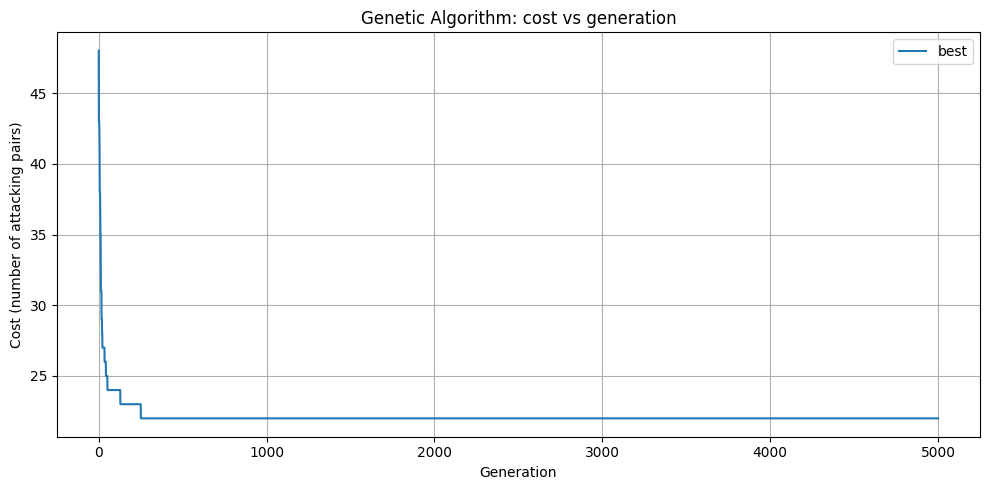

In [52]:
plot_history(history, save_path="history.png")

Best cost: 22


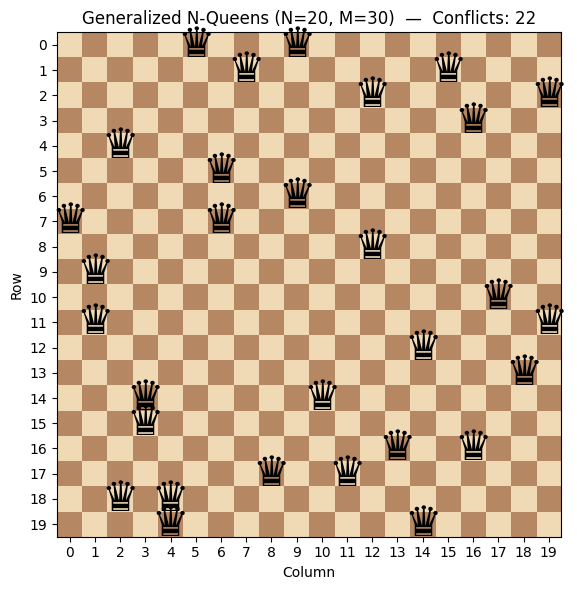

In [53]:

print("Best cost:", res.cost)
plot_board_generalized(res, figsize=(6,6))


## Simulated Annealing (for classic version of N-Queens)

In [54]:
from math import e
import math

In [113]:
class SA:
    
    def __init__(self, T: int, N: int, iters: int,
                 alpha: float, k: float = 0.1):
        
        self.alpha = alpha # Coefficient for tempreture
        self.iters = iters # Number of iterations
        self.T = T      # Initial Tempreture
        self.N = N      # Chess board size
        self.cost = 0   # Cost
        self.k = k      # Coefficient which determines what proportion of the queens should be swapped to create new neighbors
        
        # Initialize chess board randomly
        self.board = np.random.choice(range(0, self.N), size=self.N, replace=False)
        
        self.compute_cost()
        
        
    # computer current solution cost
    def compute_cost(self) -> None:
        
        self.cost = 0
        
        for i in range(self.N):
            for j in range(i+1, self.N):
                if abs(j - i) == abs(self.board[j] - self.board[i]):
                    self.cost += 1
                    

    # Create a neighbor by swapping rows
    def create_neighbor(self) -> Tuple[np.ndarray, int]:
        
        neighbor = np.copy(self.board)
        
        num = int(self.k * self.N) + 1      # How many times should the swap process occur
        for _ in range(num):
            
            indices = np.random.choice(range(self.N), size=2, replace=False)
            neighbor[indices[0]], neighbor[indices[1]] = neighbor[indices[1]], neighbor[indices[0]]
        
        neighbor_cost = self.compute_neighbor_cost(neighbor)
        
        return neighbor, neighbor_cost
            
            
        
    # Cost computation for potential new solution
    def compute_neighbor_cost(self, neighbor: np.ndarray) -> int:
        
        cost = 0
        
        for i in range(self.N):
            for j in range(i+1, self.N):
                if abs(j - i) == abs(neighbor[j] - neighbor[i]):
                    cost += 1
                    
        return cost
    
    
    def run(self) -> Tuple[np.ndarray, list]:
        
        cost_history = list()
        first_new = 0
        
        for _ in range(self.iters):
            
            if self.cost == 0:
                
                print(f"Solution with cost = 0 found!")
                
                cost_history.append(self.cost)
                return self.board, cost_history
           
            neighbor, neighbor_cost = self.create_neighbor()
            
            if neighbor_cost < self.cost:
                
                self.board = np.copy(neighbor)
                self.cost = neighbor_cost
                first_new = len(cost_history)
                    
                
            elif neighbor_cost > self.cost:
                
                if random.random() < e ** (-(neighbor_cost - self.cost) / self.T):
                    self.board = np.copy(neighbor)
                    self.cost = neighbor_cost
            
            # Reheating policy
            else:
                
                if first_new + 5000 <= len(cost_history):
                    self.T = 2
                    cost_history.append(self.cost)
                    
                    print(f"Tempreture increased to {self.T}")
                    
                    
                    continue
                    
            
            cost_history.append(self.cost)
                
                        
            
            self.T *= self.alpha
            
            print(f"Iteration {_}: Current solution is: {self.cost}, Current temperature is: {self.T}")
            
        return self.board, cost_history
            

In [122]:
np.random.seed(1)

s = SA(T=10, N=30, iters=200000, alpha=0.7)

In [123]:
start = time.time()
board, cost_history = s.run()
end = time.time()

Iteration 0: Current solution is: 16, Current temperature is: 7.0
Iteration 1: Current solution is: 20, Current temperature is: 4.8999999999999995
Iteration 2: Current solution is: 21, Current temperature is: 3.4299999999999993
Iteration 3: Current solution is: 16, Current temperature is: 2.4009999999999994
Iteration 4: Current solution is: 16, Current temperature is: 1.6806999999999994
Iteration 5: Current solution is: 16, Current temperature is: 1.1764899999999996
Iteration 6: Current solution is: 16, Current temperature is: 0.8235429999999997
Iteration 7: Current solution is: 15, Current temperature is: 0.5764800999999997
Iteration 8: Current solution is: 15, Current temperature is: 0.4035360699999998
Iteration 9: Current solution is: 15, Current temperature is: 0.2824752489999998
Iteration 10: Current solution is: 15, Current temperature is: 0.19773267429999986
Iteration 11: Current solution is: 11, Current temperature is: 0.13841287200999988
Iteration 12: Current solution is: 11, 

In [124]:
print(f"Computation time: {end - start}")

Computation time: 25.633760929107666


In [125]:
# Visualization helper
def plot_history(history: list, save_path: str = None, show: bool = True) -> None:
    
    gens = list(range(len(history)))
    plt.figure(figsize=(10, 5))
    plt.plot(gens, history, label="best")
    plt.xlabel("Generation")
    plt.ylabel("Cost (number of attacking pairs)")
    plt.title("Simulated Annealing: cost vs generation")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=200)
    if show:
        plt.show()
    plt.close()


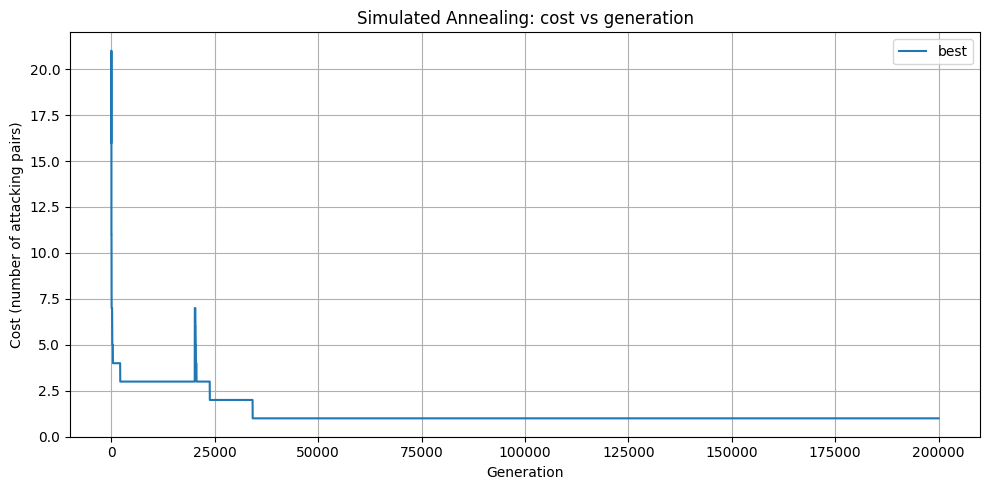

In [128]:
plot_history(cost_history, save_path="history_2.png")

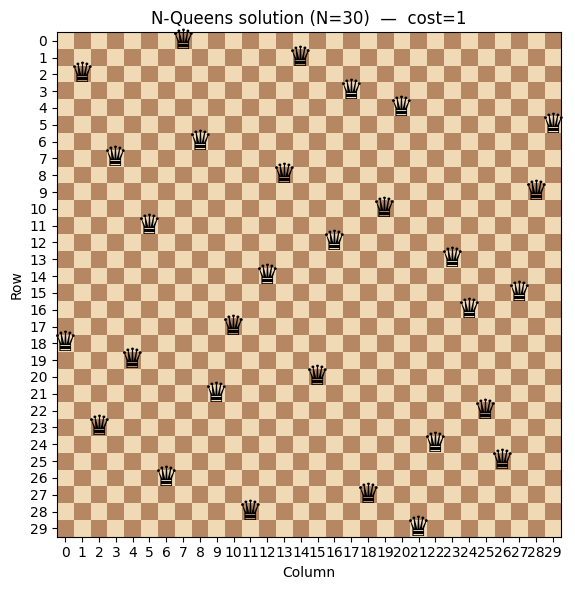

In [129]:
plot_board(s, figsize=(6,6), save_path="best_board.png", show=True)

## Simulated Annealing (Generalized N-Queens)

In [100]:
class SA_Generalized:
    
    def __init__(self, T: int, N: int, iters: int,
                 alpha: float, M: int, k: float = 0.1):
        
        self.M = M      # Number of queens
        self.alpha = alpha # Coefficient for temperature
        self.iters = iters # Number of iterations
        self.T = T      # Initial Tempreture
        self.N = N      # Chess board size
        self.cost = 0   # Cost
        self.k = k      # Coefficient which determines what proportion of the queens should be swapped to create new neighbors
        
        # Initialize chess board randomly
        self.board = np.zeros(shape=(self.N, self.N), dtype=int)
        total_num = self.N ** 2
        flat = np.random.choice(total_num, self.M, replace=False)
        row_indices, col_indices = np.unravel_index(flat, self.board.shape)
        self.board[row_indices, col_indices] = 1
        
        self.compute_cost()
        
        
    # computer current solution cost
    def compute_cost(self) -> None:
       
        self.cost = 0
        
        queen_coords = np.argwhere(self.board == 1)
        num_queens = len(queen_coords)
       
        if num_queens < 2:
            self.cost = 0
            return
            
        for i in range(num_queens):
            for j in range(i + 1, num_queens):
                
                # Get the coordinates for the two queens in the pair
                r1, c1 = queen_coords[i]
                r2, c2 = queen_coords[j]
                
                # Check for conflicts
                if r1 == r2:
                    self.cost += 1
                    
                elif c1 == c2:
                    self.cost += 1
                    
                elif abs(r1 - r2) == abs(c1 - c2):
                    self.cost += 1
                    

    # Create a neighbor by swapping rows
    def create_neighbor(self) -> Tuple[np.ndarray, int]:
        
        neighbor = np.copy(self.board)
        
        # 1. Identify all queen positions (from_coords) and all empty positions (to_coords)
        queen_coords = np.argwhere(neighbor == 1)
        empty_coords = np.argwhere(neighbor == 0)

        if len(queen_coords) == 0 or len(empty_coords) == 0:
            # If no queens or no empty spots, no move is possible
            return neighbor, self.cost

        # 2. Select a random queen to move
        from_idx = np.random.choice(len(queen_coords))
        from_r, from_c = queen_coords[from_idx]
        
        # 3. Select a random empty spot to move to
        to_idx = np.random.choice(len(empty_coords))
        to_r, to_c = empty_coords[to_idx]

        # 4. Perform the move
        neighbor[from_r, from_c] = 0 # Empty the old spot
        neighbor[to_r, to_c] = 1     # Place the queen in the new spot
        
       
        
        neighbor_cost = self.compute_neighbor_cost(neighbor)
        
        return neighbor, neighbor_cost
            
        
    # Cost computation for potential new solution
    def compute_neighbor_cost(self, neighbor: np.ndarray) -> int:
        
        cost = 0
        
        queen_coords = np.argwhere(neighbor == 1)
        num_queens = len(queen_coords)
       
        if num_queens < 2:
            cost = 0
            return cost
            
        for i in range(num_queens):
            for j in range(i + 1, num_queens):
                
                # Get the coordinates for the two queens in the pair
                r1, c1 = queen_coords[i]
                r2, c2 = queen_coords[j]
                
                # Check for conflicts
                if r1 == r2:
                    cost += 1
                    
                elif c1 == c2:
                    cost += 1
                    
                elif abs(r1 - r2) == abs(c1 - c2):
                    cost += 1
                    
        return cost
                    
    
    
    def run(self) -> Tuple[np.ndarray, list]:
        
        cost_history = list()
        first_new = 0
        
        for _ in range(self.iters):
            
            if self.cost == 0:
                
                print(f"Solution with cost = 0 found!")
                
                cost_history.append(self.cost)
                return self.board, cost_history
           
            neighbor, neighbor_cost = self.create_neighbor()
            
            if neighbor_cost < self.cost:
                
                self.board = np.copy(neighbor)
                self.cost = neighbor_cost
                first_new = len(cost_history)
                    
                
            elif neighbor_cost > self.cost:
                
                if random.random() < math.exp(-(neighbor_cost - self.cost) / self.T):
                    self.board = np.copy(neighbor)
                    self.cost = neighbor_cost
            
                    
            
            cost_history.append(self.cost)
                
                        
            
            self.T *= self.alpha
            
            print(f"Iteration {_}: Current solution is: {self.cost}, Current temperature is: {self.T}")
            
        return self.board, cost_history
            

In [101]:
np.random.seed(1)
start = time.time()
s = SA_Generalized(T=3000, N=20, iters=25000, alpha=0.99, M=30)
board, cost_history = s.run()
end = time.time()

Iteration 0: Current solution is: 73, Current temperature is: 2970.0
Iteration 1: Current solution is: 74, Current temperature is: 2940.3
Iteration 2: Current solution is: 75, Current temperature is: 2910.897
Iteration 3: Current solution is: 78, Current temperature is: 2881.7880299999997
Iteration 4: Current solution is: 75, Current temperature is: 2852.9701496999996
Iteration 5: Current solution is: 72, Current temperature is: 2824.4404482029995
Iteration 6: Current solution is: 74, Current temperature is: 2796.1960437209696
Iteration 7: Current solution is: 75, Current temperature is: 2768.23408328376
Iteration 8: Current solution is: 76, Current temperature is: 2740.551742450922
Iteration 9: Current solution is: 79, Current temperature is: 2713.146225026413
Iteration 10: Current solution is: 80, Current temperature is: 2686.014762776149
Iteration 11: Current solution is: 78, Current temperature is: 2659.1546151483876
Iteration 12: Current solution is: 79, Current temperature is: 26

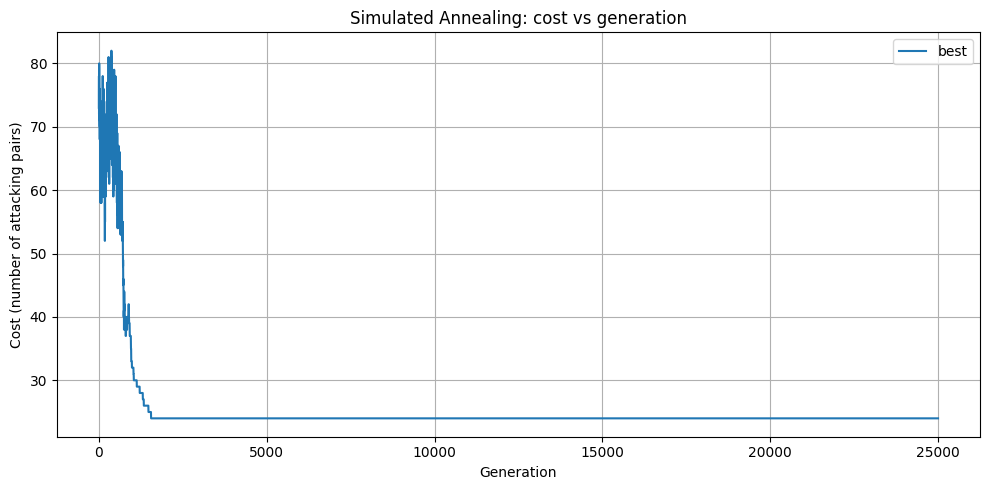

In [102]:
plot_history(cost_history, save_path="history_2.png")

In [103]:
print(f"Computation time: {end - start}")

Computation time: 8.578006029129028


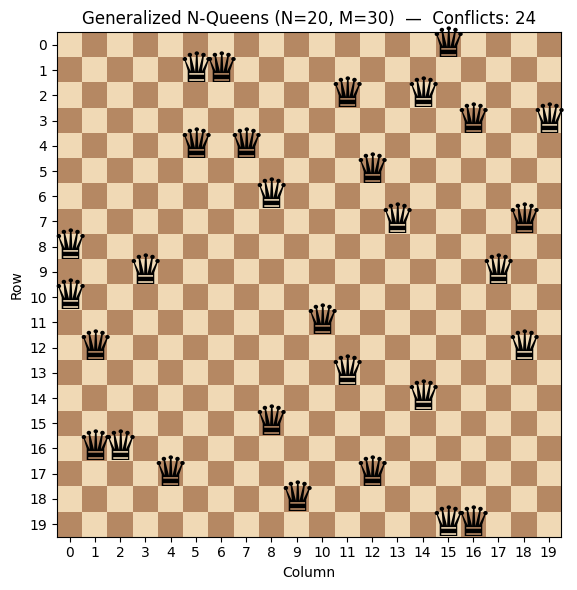

In [104]:
plot_board_generalized(s, figsize=(6,6), save_path="best_board.png", show=True)

# Report

#### This project compares two algorithmic approaches—Genetic Algorithms (GA) and Simulated Annealing (SA)—applied to both the classic N-Queens problem and a generalized N×M Queens variation.

##  Overview

#### We tested the following four configurations:
1.	Genetic Algorithm – Classic N-Queens (N = 30)

2.	Genetic Algorithm – Generalized N×M Queens (N = 20, M = 30)

3.	Simulated Annealing – Classic N-Queens (N = 30)

4.	Simulated Annealing – Generalized N×M Queens (N = 20, M = 30)



## Results

| Algorithm            | Version                | Best Cost | Time (s)   |
|----------------------|------------------------|-----------|------------|
| Genetic Algorithm    | Classic (N=30)         | **0**     | **47.87**  |
| Genetic Algorithm    | Generalized (20×30)    | **22**    | **333.58** |
| Simulated Annealing | Classic (N=30)         | **1**     | **25.63**  |
| Simulated Annealing | Generalized (20×30)    | **24**    | **8.57**   |

### 🧬 Genetic Algorithm Results

#### Classic N-Queens (N = 30)

•	Found an optimal solution (cost = 0)

•	Converged after ~3863 generations

•	Runtime: 47.87s

#### Generalized N×M Queens (20×30)

•   Best cost: 22

•	Runtime: 333.58s

•	Struggled with the larger search space




### 🔥 Simulated Annealing Results

#### Classic N-Queens (N = 30)

•	Found a solution with cost = 1

•	Runtime: 25.63s

•	Faster than GA with equal solution quality

#### Generalized N×M Queens (20×30)

•	Best cost: 24
	
•	Runtime: 8.57s
	
•	Fastest of all methods tested


##  Comparison

### ✔ Which algorithm found the more optimized solution?
	•	Classic → GA found an optimal solution
	•	Generalized → GA (cost = 22 vs 24)

### ✔ Which algorithm scales better?
	•	Simulated Annealing
	•	Lightweight
	•	Low memory cost
	•	Handles large N effectively

### ✔ Which algorithm was faster?
	•	Simulated Annealing, consistently and significantly.

⸻

### Pros & Cons of Each Algorithm

#### Genetic Algorithm

#### Pros
	•	Strong global search
	•	Can escape local minima
	
#### Cons
	•	Slow for large N
	•	Requires tuning (population, mutation, crossover)


⸻

#### Simulated Annealing

#### Pros
	•	Very fast
	•	Scales extremely well
	•	Easy to implement

#### Cons
	•	May not reach global optimum
	•	Sensitive to cooling schedule
	•	Quality varies per run

⸻

##  Hybrid Approach:

Yes, combining both is possible and often beneficial.

#### Example


 #### GA for Global Search & SA for Local Optimization
	•	GA finds a promising region
	•	SA fine-tunes the best individuals



